In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as pls 
import seaborn as sns
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(12, 8)})

In [2]:
df1 = pd.read_csv("/Users/karishma/Downloads/parlerData/parler_postsData.csv")

In [3]:
df2 = pd.read_csv("/Users/karishma/Downloads/parlerData/parler_userData.csv")

In [4]:
df1.columns

Index(['Impressions', 'Id', 'Upvotes', 'At', 'Comments', 'Reposts',
       'CreatedAt', 'Body', 'Creator'],
      dtype='object')

In [5]:
df2.columns

Index(['Name', 'Score', 'Id', 'Bio', 'Joined', 'Username', 'Interactions',
       'Human', 'Verified'],
      dtype='object')

In [6]:
len(df2)

22326

In [7]:
len(df2)*0.2

4465.2

In [8]:
len(df1)

101945

In [9]:
len(df1)*0.8

81556.0

In [10]:
df1.head(2)

,Impressions,Id,Upvotes,At,Comments,Reposts,CreatedAt,Body,Creator
0,1200,f0a22bc185a8410b97dd8e585a9d1675,13,{},0,2,20210107152010,JACK MA DISAPPEARED SINCE NOVEMB AFTER CRITICI...,b12df9cacba44ff08837b823ba906f6b
1,585,cb32e16712cf4a7487df85d4ec0cf501,3,{},0,2,20210107135304,#MAGA2020 #MAGA #ELECTIONINTEGRITY #TRUMP2020 ...,8290766df6a5425faa789461eb5051d0


In [11]:
df1_Count=df1.value_counts("Creator").reset_index(name='Contcount')
print(df1_Count)

                                Creator  Contcount
0      8290766df6a5425faa789461eb5051d0       6320
1      1186902f79324fee8e08e5670026e67c       2580
2      4bdafdbc35f94816be2ee2647d684d74       1406
3      3cbff11cfb144f898949e94f260a21e5       1105
4      2bb8e3b7c8c446dd91c59274a619339b        994
...                                 ...        ...
13437  8ffed30a3e7c45998a16731a8a28b383          1
13438  8ffcb01b23a94ea4a1c2a2913a707a9a          1
13439  8ff0ad34957241ae8b0ac2c2c65c3ccd          1
13440  8fed34bfaa154d31abe18fa763ae477c          1
13441       40-110k illegal votes in NV          1

[13442 rows x 2 columns]


In [12]:
df1_Count.columns

Index(['Creator', 'Contcount'], dtype='object')

In [13]:
df1_Count=df1_Count.head(10)
print(df1_Count)

                            Creator  Contcount
0  8290766df6a5425faa789461eb5051d0       6320
1  1186902f79324fee8e08e5670026e67c       2580
2  4bdafdbc35f94816be2ee2647d684d74       1406
3  3cbff11cfb144f898949e94f260a21e5       1105
4  2bb8e3b7c8c446dd91c59274a619339b        994
5  dd79944c7a9a4571b30f4433a879c391        966
6  56105481a4f24e9ca8793ac1d097bb4d        922
7  ffdf1fc30ac5416fa7cb2e6ad1d43291        917
8  d6b275d38bc34e04ba4d147cc9cf8a6f        873
9  d8351de608ea4442a8feeb58c4bd191a        846


In [14]:
Total=df1["Id"].count()
print(Total)


101945


In [15]:
def ind_perc (row):
    return (row['Contcount']/Total)*100

In [16]:
df1_Count.apply (lambda row: ind_perc(row), axis=1)


0    6.199421
1    2.530776
2    1.379175
3    1.083918
4    0.975036
5    0.947570
6    0.904409
7    0.899505
8    0.856344
9    0.829859
dtype: float64

In [17]:
df1_Count['Ind_Perc'] = df1_Count.apply (lambda row:ind_perc(row), axis=1)


In [18]:
print(df1_Count)

                            Creator  Contcount  Ind_Perc
0  8290766df6a5425faa789461eb5051d0       6320  6.199421
1  1186902f79324fee8e08e5670026e67c       2580  2.530776
2  4bdafdbc35f94816be2ee2647d684d74       1406  1.379175
3  3cbff11cfb144f898949e94f260a21e5       1105  1.083918
4  2bb8e3b7c8c446dd91c59274a619339b        994  0.975036
5  dd79944c7a9a4571b30f4433a879c391        966  0.947570
6  56105481a4f24e9ca8793ac1d097bb4d        922  0.904409
7  ffdf1fc30ac5416fa7cb2e6ad1d43291        917  0.899505
8  d6b275d38bc34e04ba4d147cc9cf8a6f        873  0.856344
9  d8351de608ea4442a8feeb58c4bd191a        846  0.829859


In [19]:
df2["Creator"]=df2["Id"]
df2.head(2)

,Name,Score,Id,Bio,Joined,Username,Interactions,Human,Verified,Creator
0,Sarah Girl,1200,da0f9535a8b6496abc14010aaf9be246,NaN,20201127230523,PrincessofGod20,258,False,False,da0f9535a8b6496abc14010aaf9be246
1,Millstone-Diaries,3200,ac38ce34a28d403d90fd1dd93bbe32b6,An Uncompromising Christian and Believer in th...,20190529011653,IMKane,258,False,False,ac38ce34a28d403d90fd1dd93bbe32b6


In [20]:
df1_User=df1_Count.merge(df2, on="Creator", how='left')
df1_User

,Creator,Contcount,Ind_Perc,Name,Score,Id,Bio,Joined,Username,Interactions,Human,Verified
0,8290766df6a5425faa789461eb5051d0,6320,6.199421,Duane Richardson,23000,8290766df6a5425faa789461eb5051d0,"#Patriot , I believe in God, The Holy Bible, T...",20201107115354,Patriots4US,266,True,False
1,1186902f79324fee8e08e5670026e67c,2580,2.530776,@WakeUpMfers,16000,1186902f79324fee8e08e5670026e67c,Let Your Life Be a Counter-Friction to Stop th...,20201127041453,TheRealWakeUpMfers,258,False,False
2,4bdafdbc35f94816be2ee2647d684d74,1406,1.379175,GameOver,9000,4bdafdbc35f94816be2ee2647d684d74,NaN,20190601002918,GameOver,258,False,False
3,3cbff11cfb144f898949e94f260a21e5,1105,1.083918,Billyboy428,12000,3cbff11cfb144f898949e94f260a21e5,NaN,20201108142211,Billyboy428,259,True,False
4,2bb8e3b7c8c446dd91c59274a619339b,994,0.975036,Maryland Crabbing,15000,2bb8e3b7c8c446dd91c59274a619339b,youtube.com/c/jakephelpsmarylandcrabbing Pleas...,20201225164602,marylandcrabbing,259,True,False
5,dd79944c7a9a4571b30f4433a879c391,966,0.947570,2ndPro1776,3100,dd79944c7a9a4571b30f4433a879c391,"“We, too, born to freedom, and believing in fr...",20200629225305,2ndPro1776,259,True,False
6,56105481a4f24e9ca8793ac1d097bb4d,922,0.904409,LucidKeK,20000,56105481a4f24e9ca8793ac1d097bb4d,🇺🇸MAGA🇺🇸\n💥#WeThePeople💥\nRemoved from IG at 3...,20201110164009,LucidKeK,3,True,False
7,ffdf1fc30ac5416fa7cb2e6ad1d43291,917,0.899505,Unravel_the_Web,10000,ffdf1fc30ac5416fa7cb2e6ad1d43291,NaN,20201025003116,UnravelTheWeb,386,False,False
8,d6b275d38bc34e04ba4d147cc9cf8a6f,873,0.856344,Grinnell Pioneer,10000,d6b275d38bc34e04ba4d147cc9cf8a6f,NaN,20200528231128,GrinPioneer,259,True,False
9,d8351de608ea4442a8feeb58c4bd191a,846,0.829859,🦉Reesey Kaminski,26000,d8351de608ea4442a8feeb58c4bd191a,Idontwearmasks🐊get your gun🔫 ‼️⚔️🇺🇸⚔️\nPPL MUS...,20200529115318,Reeseysnotsorry,258,False,False


In [21]:
df1_User.columns

Index(['Creator', 'Contcount', 'Ind_Perc', 'Name', 'Score', 'Id', 'Bio',
       'Joined', 'Username', 'Interactions', 'Human', 'Verified'],
      dtype='object')

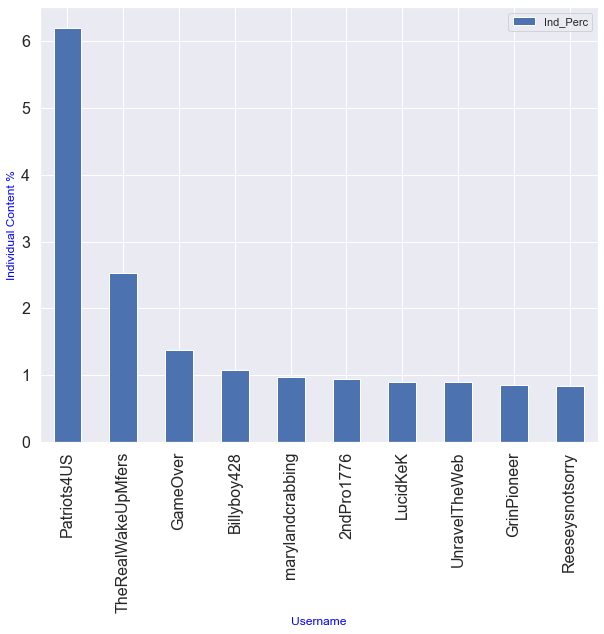

In [22]:

#pls.figure()
#pls.rcParams.update({'font.size': 22})
fplot1=df1_User.plot(x="Username", y="Ind_Perc",figsize=(10,8), kind="bar", xlabel="Username",ylabel="Individual Content %", fontsize=16)
fplot1.yaxis.label.set_color('blue')
fplot1.xaxis.label.set_color('blue')


In [23]:
T10count=df1_User["Contcount"].sum()
print(T10count)

16929


In [24]:
Percentage_of_posts_by_top10_users=(T10count/Total)*100
print(Percentage_of_posts_by_top10_users)

16.60601304625043


In [25]:
def set_status (row):
    if (row["Verified"]==True) and (row["Human"]==True):
        return "a"
    if (row["Verified"]==True) and (row["Human"]==False):
        return "b"
    if (row["Verified"]==False) and (row["Human"]==True):
        return "c"
    if (row["Verified"]==False) and (row["Human"]==False):
        return "d"
    
    #return (row['Contcount']/Total)*100

In [26]:
df1_User.apply (lambda row: set_status(row), axis=1)


0    c
1    d
2    d
3    c
4    c
5    c
6    c
7    d
8    c
9    d
dtype: object

In [27]:
df1_User['Status'] = df1_User.apply (lambda row: set_status(row), axis=1)
df1_User


,Creator,Contcount,Ind_Perc,Name,Score,Id,Bio,Joined,Username,Interactions,Human,Verified,Status
0,8290766df6a5425faa789461eb5051d0,6320,6.199421,Duane Richardson,23000,8290766df6a5425faa789461eb5051d0,"#Patriot , I believe in God, The Holy Bible, T...",20201107115354,Patriots4US,266,True,False,c
1,1186902f79324fee8e08e5670026e67c,2580,2.530776,@WakeUpMfers,16000,1186902f79324fee8e08e5670026e67c,Let Your Life Be a Counter-Friction to Stop th...,20201127041453,TheRealWakeUpMfers,258,False,False,d
2,4bdafdbc35f94816be2ee2647d684d74,1406,1.379175,GameOver,9000,4bdafdbc35f94816be2ee2647d684d74,NaN,20190601002918,GameOver,258,False,False,d
3,3cbff11cfb144f898949e94f260a21e5,1105,1.083918,Billyboy428,12000,3cbff11cfb144f898949e94f260a21e5,NaN,20201108142211,Billyboy428,259,True,False,c
4,2bb8e3b7c8c446dd91c59274a619339b,994,0.975036,Maryland Crabbing,15000,2bb8e3b7c8c446dd91c59274a619339b,youtube.com/c/jakephelpsmarylandcrabbing Pleas...,20201225164602,marylandcrabbing,259,True,False,c
5,dd79944c7a9a4571b30f4433a879c391,966,0.947570,2ndPro1776,3100,dd79944c7a9a4571b30f4433a879c391,"“We, too, born to freedom, and believing in fr...",20200629225305,2ndPro1776,259,True,False,c
6,56105481a4f24e9ca8793ac1d097bb4d,922,0.904409,LucidKeK,20000,56105481a4f24e9ca8793ac1d097bb4d,🇺🇸MAGA🇺🇸\n💥#WeThePeople💥\nRemoved from IG at 3...,20201110164009,LucidKeK,3,True,False,c
7,ffdf1fc30ac5416fa7cb2e6ad1d43291,917,0.899505,Unravel_the_Web,10000,ffdf1fc30ac5416fa7cb2e6ad1d43291,NaN,20201025003116,UnravelTheWeb,386,False,False,d
8,d6b275d38bc34e04ba4d147cc9cf8a6f,873,0.856344,Grinnell Pioneer,10000,d6b275d38bc34e04ba4d147cc9cf8a6f,NaN,20200528231128,GrinPioneer,259,True,False,c
9,d8351de608ea4442a8feeb58c4bd191a,846,0.829859,🦉Reesey Kaminski,26000,d8351de608ea4442a8feeb58c4bd191a,Idontwearmasks🐊get your gun🔫 ‼️⚔️🇺🇸⚔️\nPPL MUS...,20200529115318,Reeseysnotsorry,258,False,False,d


In [28]:
colour_list = {"a": 'g',"b":'b',"c":"y","d":"r"}


/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 129417 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 129417 missing from current font.
  font.set_text(s, 0, flags=flags)


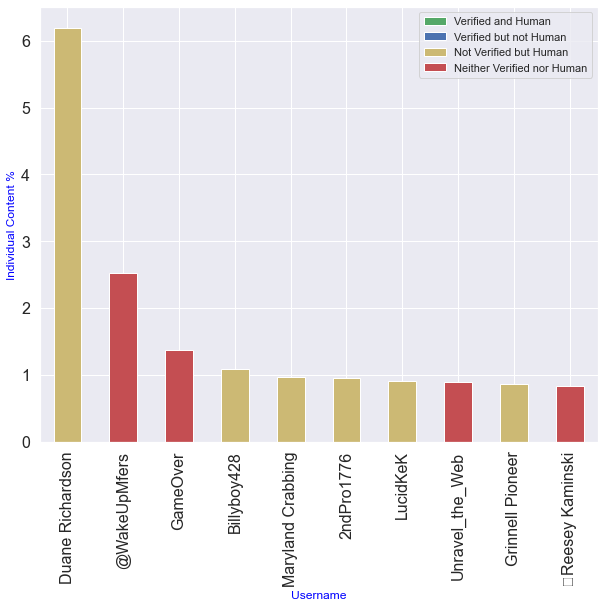

In [29]:
#c_list=['y','b','r','g']
from matplotlib.patches import Patch

fplot2=df1_User.plot(x="Name", y="Ind_Perc", color=df1_User["Status"].replace(colour_list), kind="bar", xlabel="Username",ylabel="Individual Content %",fontsize=16,figsize=(10,8))
fplot2.legend(
    [
        Patch(facecolor='g'),
        Patch(facecolor='b'),
        Patch(facecolor='y'),
        Patch(facecolor='r')
    ], ["Verified and Human", "Verified but not Human","Not Verified but Human", "Neither Verified nor Human"]
)
fplot2.yaxis.label.set_color('blue')
fplot2.xaxis.label.set_color('blue')


In [30]:
df2['Status'] = df2.apply (lambda row: set_status(row), axis=1)
df2.head(5)

,Name,Score,Id,Bio,Joined,Username,Interactions,Human,Verified,Creator,Status
0,Sarah Girl,1200,da0f9535a8b6496abc14010aaf9be246,NaN,20201127230523,PrincessofGod20,258,False,False,da0f9535a8b6496abc14010aaf9be246,d
1,Millstone-Diaries,3200,ac38ce34a28d403d90fd1dd93bbe32b6,An Uncompromising Christian and Believer in th...,20190529011653,IMKane,258,False,False,ac38ce34a28d403d90fd1dd93bbe32b6,d
2,Garrett Karls MAGA,325,7e544918da634f368dd0c13a9116e527,"Conservative, Trump supporter. and a father of...",20201101154323,GarrettKarls,387,True,False,7e544918da634f368dd0c13a9116e527,c
3,Proud Boys,544000,976d38b4a1a54b33888ed97ca88ca03a,DISAVOWED BOYS - POOR BOYS - Western chauvinis...,20190530151237,TheProudBoys,3,False,True,976d38b4a1a54b33888ed97ca88ca03a,b
4,Rudy G,490000,ac3d687553924ca48daf698cefb7a73d,https://rudygiulianics.com/,20190508004705,RudyG,263,False,True,ac3d687553924ca48daf698cefb7a73d,b


In [31]:
df2.sort_values('Score', ascending=False)

,Name,Score,Id,Bio,Joined,Username,Interactions,Human,Verified,Creator,Status
70,Dan Bongino,6000000,823acd76fe299a9a98851c9cdad78df5,RESIST,20181208185010,Dbongino,263,False,True,823acd76fe299a9a98851c9cdad78df5,b
69,Mark Levin,5800000,34968cde93e74071990f927980baa2d9,THIS IS THE OFFICIAL MARK LEVIN SHOW PARLER PA...,20190601031706,Marklevinshow,8478,False,True,34968cde93e74071990f927980baa2d9,b
135,Sean Hannity,5700000,4b8638eca2db4b17b3a7203e40ac8ce7,TV Host Fox News Channel 9 PM EST. Nationally ...,20200624142814,SeanHannity,263,True,True,4b8638eca2db4b17b3a7203e40ac8ce7,a
43,LLinWood,5200000,2ea66900ed69a5005fe51fc8b07a1711,NaN,20181213133214,linwood,258,False,True,2ea66900ed69a5005fe51fc8b07a1711,b
53,Dinesh D’Souza,4500000,27e957738eef23c55a3214d1b1154fbd,"I’m an author, speaker and filmmaker. Find out...",20181212003133,DineshDSouza,259,False,True,27e957738eef23c55a3214d1b1154fbd,b
...,...,...,...,...,...,...,...,...,...,...,...
2224,🇺🇸 INSURRECTIONISTS get the DORNER🇺🇸,-57000,02ce390c27b8457b81dfb11bbfb4ad6c,"REPUBLICANS LOST ALL POWER, SO SHUT THE FUCK U...",20201231201214,DaveDennison,2,False,False,02ce390c27b8457b81dfb11bbfb4ad6c,d
8804,private,-57000,376b385fb4e040a5ae718284d3e481e0,,20201108195712,Urmommy1,3,True,False,376b385fb4e040a5ae718284d3e481e0,c
11170,BootyEater,-92000,5a5a0e5c8bf140248befcfed537991e3,Galatians 4:16,20201109144655,TrumpHater69420,2,False,False,5a5a0e5c8bf140248befcfed537991e3,d
1679,JoeBiden/Harris,-94000,a8b161e4263d44799d65af1b2a880c95,If I got paid a dollar for every time I was ri...,20201111201602,PresidentJoeBiden20,258,False,False,a8b161e4263d44799d65af1b2a880c95,d


In [32]:
df2_Upvotes=df2.sort_values("Score", ascending=False).head(10)
df2_Upvotes

,Name,Score,Id,Bio,Joined,Username,Interactions,Human,Verified,Creator,Status
70,Dan Bongino,6000000,823acd76fe299a9a98851c9cdad78df5,RESIST,20181208185010,Dbongino,263,False,True,823acd76fe299a9a98851c9cdad78df5,b
69,Mark Levin,5800000,34968cde93e74071990f927980baa2d9,THIS IS THE OFFICIAL MARK LEVIN SHOW PARLER PA...,20190601031706,Marklevinshow,8478,False,True,34968cde93e74071990f927980baa2d9,b
135,Sean Hannity,5700000,4b8638eca2db4b17b3a7203e40ac8ce7,TV Host Fox News Channel 9 PM EST. Nationally ...,20200624142814,SeanHannity,263,True,True,4b8638eca2db4b17b3a7203e40ac8ce7,a
43,LLinWood,5200000,2ea66900ed69a5005fe51fc8b07a1711,NaN,20181213133214,linwood,258,False,True,2ea66900ed69a5005fe51fc8b07a1711,b
53,Dinesh D’Souza,4500000,27e957738eef23c55a3214d1b1154fbd,"I’m an author, speaker and filmmaker. Find out...",20181212003133,DineshDSouza,259,False,True,27e957738eef23c55a3214d1b1154fbd,b
504,Tommy Robinson,4000000,b1ad1b19a70d43ffa9c21a1b650022a5,I’m back \n\nhttps://www.tr.news/,20190602193935,TommyRobinson,386,False,True,b1ad1b19a70d43ffa9c21a1b650022a5,b
739,The Epoch Times,3500000,4a74305666cb159137a0c105106def7f,"An independent, award-winning voice in print &...",20181219175923,epochtimes,263,True,False,4a74305666cb159137a0c105106def7f,c
146,We Love President Donald J. Trump,2000000,12b91e0106fb4985a6bb347cb83181f7,Defender of MAGA\nTrump 2016-2024\nDailyTruthR...,20190603183448,WeLoveTrump,266,True,False,12b91e0106fb4985a6bb347cb83181f7,c
7726,private,2000000,7826fe7dc30d4d399660ca9b049e3b28,,20200629152238,Redcode71,3,True,False,7826fe7dc30d4d399660ca9b049e3b28,c
55,The Gateway Pundit,2000000,3df53eb29aa5466e9fe84ea689927ae9,Jim Hoft Founder-Editor The Gateway Pundit -- ...,20190611040821,GatewayPundit,259,False,True,3df53eb29aa5466e9fe84ea689927ae9,b


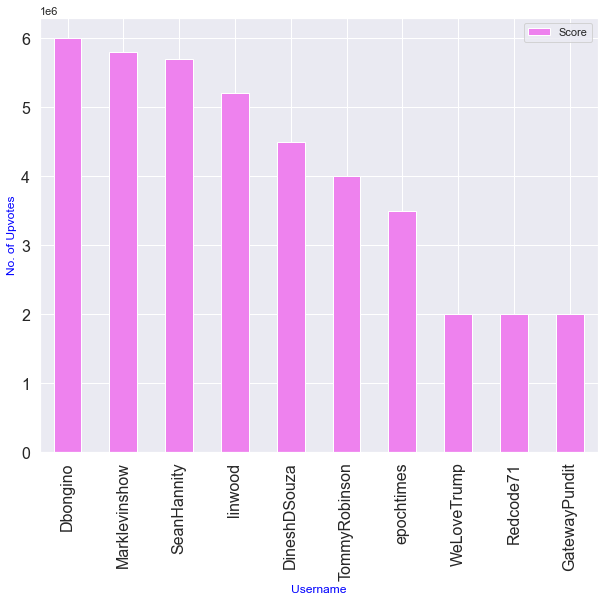

In [33]:
fplot3=df2_Upvotes.plot(x="Username", y="Score", kind="bar", xlabel="Username",ylabel="No. of Upvotes", color='violet',figsize=(10,8),fontsize=16)
fplot3.yaxis.label.set_color('blue')
fplot3.xaxis.label.set_color('blue')

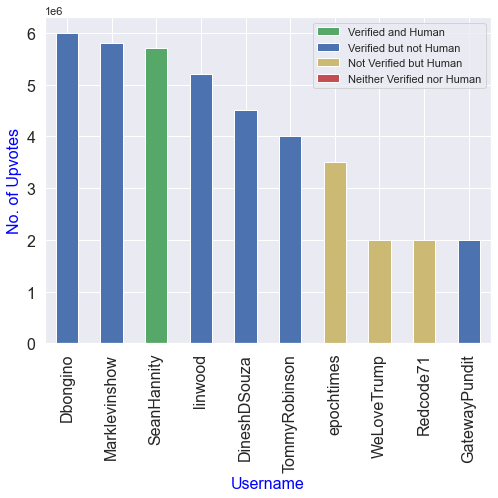

In [34]:
fplot6=df2_Upvotes.plot(x="Username", y="Score", color=df2_Upvotes["Status"].replace(colour_list), kind="bar", figsize=(8,6),fontsize=16)
fplot6.legend(
    [
        Patch(facecolor='g'),
        Patch(facecolor='b'),
        Patch(facecolor='y'),
        Patch(facecolor='r')
    ], ["Verified and Human", "Verified but not Human","Not Verified but Human", "Neither Verified nor Human"]
)
fplot6.yaxis.label.set_color('blue')
fplot6.set_xlabel("Username", size=16)
fplot6.set_ylabel("No. of Upvotes",size=16)
fplot6.xaxis.label.set_color('blue')

In [35]:
df2_Interactions=df2.sort_values("Interactions", ascending=False).head(10)
df2_Interactions

,Name,Score,Id,Bio,Joined,Username,Interactions,Human,Verified,Creator,Status
69,Mark Levin,5800000,34968cde93e74071990f927980baa2d9,THIS IS THE OFFICIAL MARK LEVIN SHOW PARLER PA...,20190601031706,Marklevinshow,8478,False,True,34968cde93e74071990f927980baa2d9,b
9882,Amy Peikoff,30000,8f39d642c9864dc394b7000079af6ec1,@Parler Policy | \n\nOfficial Parler statement...,20200425194804,AmyPeikoff,6503,True,False,8f39d642c9864dc394b7000079af6ec1,c
183,Parler,24000,a078092e6e2df507bfd12db4710e3290,Parler is committed to non-partisan free speec...,20180828145432,parler,6407,False,True,a078092e6e2df507bfd12db4710e3290,b
342,Parler Dev Announcements,1400,c25a9f2eb2451d64b00c95e83cd031ec,Official announcements from the Parler Develop...,20181227223418,parlerdev,6403,False,True,c25a9f2eb2451d64b00c95e83cd031ec,b
21580,oathk33per,536,1484d53738614756ad9f0e72fb4fb1e0,"I work QA for Parler - let’s get this 🍞. Also,...",20200727184252,oathkeep3r,6275,True,False,1484d53738614756ad9f0e72fb4fb1e0,c
16619,Jared,52,a078092e6e2df507bfd12db4710202ab,Founder and Lead Engineer at Parler\n\nSamurai...,20180823190525,Jared,6247,False,True,a078092e6e2df507bfd12db4710202ab,b
9394,USMC Patriot,1500,b911aa52e9324dffad78c292da4ac549,#usmcveteran #dontcaliforniamytexas \n#trump20...,20200630162358,OmegaGeek,4131,True,False,b911aa52e9324dffad78c292da4ac549,c
7476,Jeffreywernick,21000,ea6cb7c55a9e4b049c989163a990c422,"Early bitcoin adopter, advocate and acquirer. ...",20200120220030,Jeffreywernick,2307,True,False,ea6cb7c55a9e4b049c989163a990c422,c
104,John Matze 🇺🇸,257000,a078092e6e2df507bfd12db471029eb3,Founder/CEO of Parler and iPhone developer 📱\n...,20180824131026,John,2151,True,True,a078092e6e2df507bfd12db471029eb3,a
18235,木兰传奇（文奇）,312,b1213245e2814707afaa2cbf6754862a,NaN,20200629034954,Mulan2020,1410,False,False,b1213245e2814707afaa2cbf6754862a,d


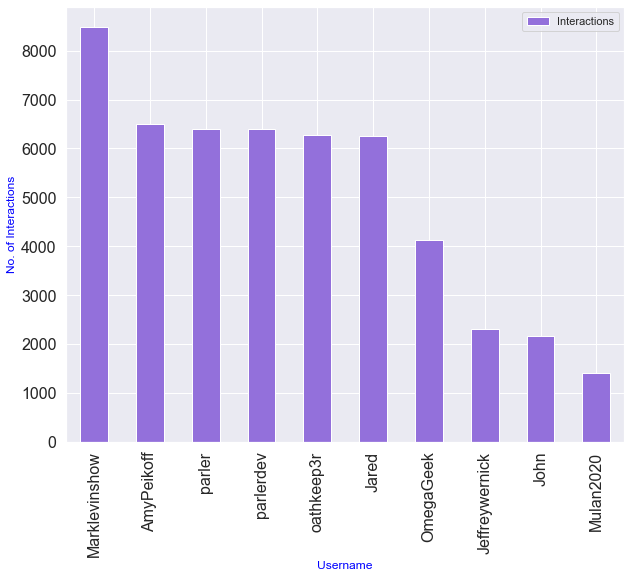

In [36]:
fplot4=df2_Interactions.plot(x="Username", y="Interactions", kind="bar", xlabel="Username",ylabel="No. of Interactions", color='mediumpurple',figsize=(10,8),fontsize=16)
fplot4.yaxis.label.set_color('blue')
fplot4.xaxis.label.set_color('blue')

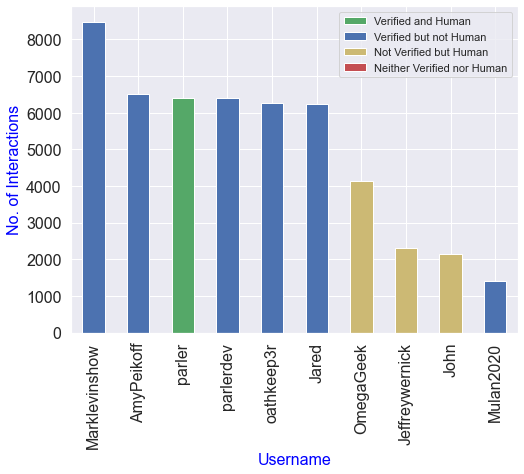

In [37]:
fplot7=df2_Interactions.plot(x="Username", y="Interactions", color=df2_Upvotes["Status"].replace(colour_list), kind="bar", figsize=(8,6),fontsize=16)
fplot7.legend(
    [
        Patch(facecolor='g'),
        Patch(facecolor='b'),
        Patch(facecolor='y'),
        Patch(facecolor='r')
    ], ["Verified and Human", "Verified but not Human","Not Verified but Human", "Neither Verified nor Human"]
)
fplot7.yaxis.label.set_color('blue')
fplot7.set_xlabel("Username", size=16)
fplot7.set_ylabel("No. of Interactions",size=16)
fplot7.xaxis.label.set_color('blue')

In [38]:
df1_Mentions=df1.copy()
df1_Mentions.iloc[0]["At"]
df1_Mentions

,Impressions,Id,Upvotes,At,Comments,Reposts,CreatedAt,Body,Creator
0,1200,f0a22bc185a8410b97dd8e585a9d1675,13,{},0,2,20210107152010,JACK MA DISAPPEARED SINCE NOVEMB AFTER CRITICI...,b12df9cacba44ff08837b823ba906f6b
1,585,cb32e16712cf4a7487df85d4ec0cf501,3,{},0,2,20210107135304,#MAGA2020 #MAGA #ELECTIONINTEGRITY #TRUMP2020 ...,8290766df6a5425faa789461eb5051d0
2,575,95e3375166e34ba78bcd923f2ad4a3e2,7,{},0,1,20210107133202,#MAGA2020 #MAGA #ELECTIONINTEGRITY #TRUMP2020 ...,8290766df6a5425faa789461eb5051d0
3,573,c13cde4dd090430c8f767cab2f5a8e9f,6,{},0,0,20210107132935,#MAGA2020 #MAGA #ELECTIONINTEGRITY #TRUMP2020 ...,8290766df6a5425faa789461eb5051d0
4,783,a227038bb5f84e559d411826af70f465,6,{},0,3,20210107122729,#MAGA2020 #MAGA #ELECTIONINTEGRITY #TRUMP2020 ...,8290766df6a5425faa789461eb5051d0
...,...,...,...,...,...,...,...,...,...
101940,209,5d57d41ead594f51b6df788b681ded5f,0,{},0,0,20201127164237,The dozen belated disclosures that turned the ...,804e16c75cc74b309cd325f7f8cc96ae
101941,2200,50d7e24154cd46149486baad0dd9148a,22,{},1,12,20201127163307,"To put this in perspective, a 70% turnout woul...",02bc6e6a7cb349c2ac4a7bb9d4bdd12c
101942,119,1ee8b9bb259a4306851d608f51571a62,1,{},0,0,20201127162850,#trump #killary #coup #clintoncrimefamily #joe...,2dd8e283205346889dab4e884f81c0c5
101943,313,97cf2a94a13c4d63bbea5824544928c1,4,{},1,1,20201127161910,The Plot Against the President 2020 Documentar...,8b3b4ad742024b9a8e878fbdb3402bf3


In [39]:
import json
import ast


In [40]:
dict_mentions={}
def count_Mentions(row):
    #print (row)
    istr=row["At"]
    #print(istr)
    #mention_dict = json.loads(istr)
    mention_dict = ast.literal_eval(istr)

    #print(mention_dict)
    for usern in mention_dict:
        if usern in dict_mentions: 
            dict_mentions[usern] += 1
        else: 
            dict_mentions[usern] = 1

    return None

In [41]:
df1_Mentions.apply(lambda row: count_Mentions(row), axis=1)


0         None
1         None
2         None
3         None
4         None
          ... 
101940    None
101941    None
101942    None
101943    None
101944    None
Length: 101945, dtype: object

In [42]:
# #print(dict_mentions)
# #df1_Mentions
# # dict_mentions_sorted = sorted(dict_mentions, key=dict_mentions.get, reverse=True)
# # dict_mentions_sorted
# import collections

# dict_mentions_sorted = collections.OrderedDict(dict_mentions)
# #dict_mentions_sorted=dict_mentions_sorted.reverse()
# dict_mentions_sorted

In [43]:

df = pd.DataFrame.from_dict(dict_mentions, orient ='index')  

df["No_of_Mentions"] = df.index
df.columns =["No_of_Mentions",'Username']
#df2_Interactions=df2.sort_values("Interactions", ascending=False).head(10)

df_Mentions=df.sort_values("No_of_Mentions", ascending=False).head(10)
df_Mentions

,No_of_Mentions,Username
teamtrump,3363,teamtrump
linwood,2802,linwood
seanhannity,2185,seanhannity
marklevinshow,2139,marklevinshow
genflynn,1805,genflynn
tuckercarlson,1786,tuckercarlson
rudyg,1507,rudyg
blocked,1130,blocked
danscavino45,1103,danscavino45
sidneypowell,859,sidneypowell


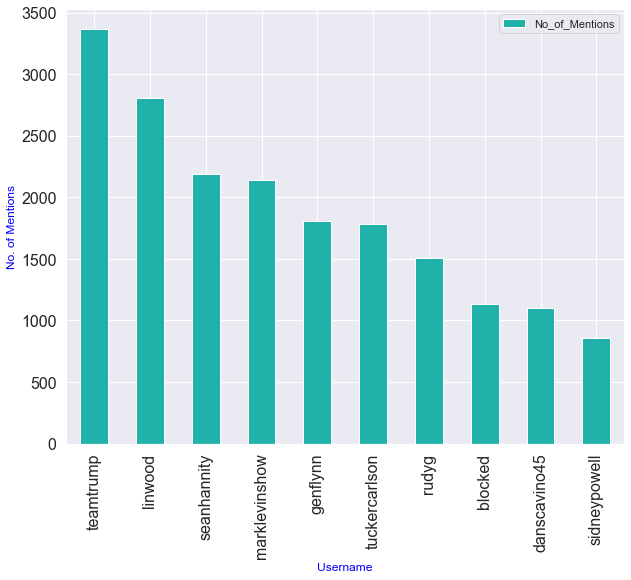

In [44]:
fplot5=df_Mentions.plot(x="Username", y="No_of_Mentions", kind="bar", xlabel="Username",ylabel="No. of Mentions", color='lightseagreen',figsize=(10,8),fontsize=16)
fplot5.yaxis.label.set_color('blue')
fplot5.xaxis.label.set_color('blue')

In [45]:
df_Mentions_Status=df.merge(df2, on="Username")
df_Mentions_Status

,No_of_Mentions,Username,Name,Score,Id,Bio,Joined,Interactions,Human,Verified,Creator,Status
0,564,republicanparty,GOP,-11,310f7705eb27b5f33faeff3c14ac88da,The best source for real news and conservative...,20181214003616,422,False,False,310f7705eb27b5f33faeff3c14ac88da,d
1,1130,blocked,Blocked,0,167df95946cb42bfa06afe136cb8eb28,This is a placeholder for a user that has bloc...,20200401055550,258,False,False,167df95946cb42bfa06afe136cb8eb28,d
2,1,espn,ESPN,0,fe23948cd81123aeed2394d6d49a8857,NaN,20181213034303,258,False,False,fe23948cd81123aeed2394d6d49a8857,d
3,122,parler,Parler,24000,a078092e6e2df507bfd12db4710e3290,Parler is committed to non-partisan free speec...,20180828145432,6407,False,True,a078092e6e2df507bfd12db4710e3290,b
4,1,realpolitical,Real Political,112,10f6e32031464d7b963cb17aecce451a,We do videos and stuff. Follow us for more!,20201109002011,259,True,False,10f6e32031464d7b963cb17aecce451a,c
...,...,...,...,...,...,...,...,...,...,...,...,...
370,1,christopherleebowman79,ChristopherLeeBowman,126,8a182183b98e4420b444b8da051cac05,"Hello, my name is chris. i love my country, i ...",20200904214249,2,False,False,8a182183b98e4420b444b8da051cac05,d
371,1,citizenofthegalaxy,QueenMalt,1500,01802990f58d4cd49cb2c03cf006a053,During VPdebate twitter ban after 12 yrs. My g...,20200527034011,259,False,False,01802990f58d4cd49cb2c03cf006a053,d
372,1,concernedmama21,ConcernedMama21,0,09ed91a12a2246e1b80f326633e6de38,Concerned about the future of our country. Bel...,20200623235013,258,False,False,09ed91a12a2246e1b80f326633e6de38,d
373,1,amandaintexas,Amanda in Texas,10000,bf8b271b2bc34764bb3422eadfe988a2,"🐘 🇺🇸 ❤Jesus, Guns, Freedom, Texas, and the Ame...",20201109153140,259,True,False,bf8b271b2bc34764bb3422eadfe988a2,c


In [46]:
df_Mentions_Status_Plot=df_Mentions_Status.sort_values("No_of_Mentions", ascending=False)
df_Mentions_Status_Plot=df_Mentions_Status_Plot.head(10)
df_Mentions_Status_Plot

,No_of_Mentions,Username,Name,Score,Id,Bio,Joined,Interactions,Human,Verified,Creator,Status
7,2802,linwood,LLinWood,5200000,2ea66900ed69a5005fe51fc8b07a1711,NaN,20181213133214,258,False,True,2ea66900ed69a5005fe51fc8b07a1711,b
1,1130,blocked,Blocked,0,167df95946cb42bfa06afe136cb8eb28,This is a placeholder for a user that has bloc...,20200401055550,258,False,False,167df95946cb42bfa06afe136cb8eb28,d
0,564,republicanparty,GOP,-11,310f7705eb27b5f33faeff3c14ac88da,The best source for real news and conservative...,20181214003616,422,False,False,310f7705eb27b5f33faeff3c14ac88da,d
263,443,thomasphillipsofficial,Thomas (Tep) Phillips,40,b9094d3cd55341ca814e83f5ed709abd,NaN,20201108031659,259,True,False,b9094d3cd55341ca814e83f5ed709abd,c
94,391,justthetipq,justthetipq,8100,35124b307155419095338e2df4bd1fd3,NaN,20200626125328,3,True,False,35124b307155419095338e2df4bd1fd3,c
22,295,senrandpaul,Senator Rand Paul,338,79c0f2a7225145a38866cc999ad09766,U.S. Senator for Kentucky | I fight for the Co...,20190710174648,282,False,True,79c0f2a7225145a38866cc999ad09766,b
15,202,newsmaxtv,Newsmax TV,75000,0cdb986d650641bd89bacaffd9b624b5,"Top news headlines, videos and comments from N...",20201108042517,266,False,False,0cdb986d650641bd89bacaffd9b624b5,d
46,189,ntdnews,NTD,1600000,c94f07d2db5b40e09b022a9d239d2d86,Your independent voice in television news—brin...,20190614192119,262,False,False,c94f07d2db5b40e09b022a9d239d2d86,d
221,168,businessnews,Business News,222,360a3a46cd0544c1b87773bc326891df,This is a repost account. Strategy + Business ...,20191107210952,258,False,False,360a3a46cd0544c1b87773bc326891df,d
26,151,epochtimes,The Epoch Times,3500000,4a74305666cb159137a0c105106def7f,"An independent, award-winning voice in print &...",20181219175923,263,True,False,4a74305666cb159137a0c105106def7f,c


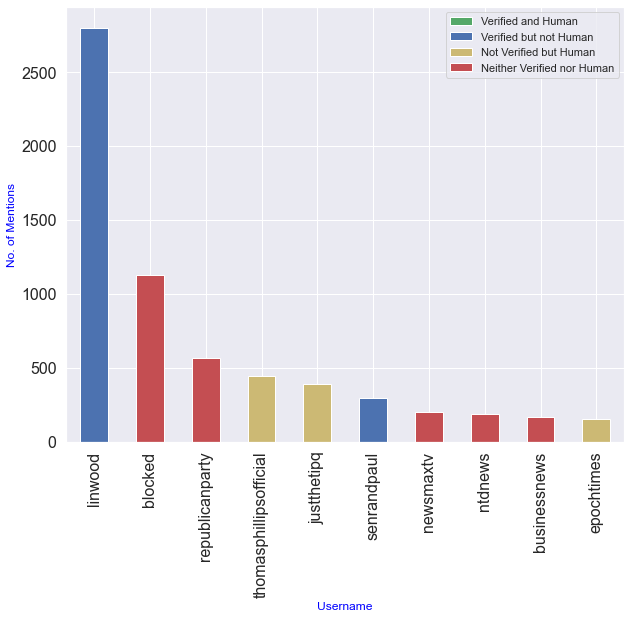

In [47]:
fplot8=df_Mentions_Status_Plot.plot(x="Username", y="No_of_Mentions", color=df_Mentions_Status_Plot["Status"].replace(colour_list), kind="bar", xlabel="Username",ylabel="No. of Mentions",figsize=(10,8),fontsize=16)
fplot8.legend(
    [
        Patch(facecolor='g'),
        Patch(facecolor='b'),
        Patch(facecolor='y'),
        Patch(facecolor='r')
    ], ["Verified and Human", "Verified but not Human","Not Verified but Human", "Neither Verified nor Human"]
)
fplot8.yaxis.label.set_color('blue')
fplot8.xaxis.label.set_color('blue')

In [48]:
from wordcloud import WordCloud, STOPWORDS 

stopwords = set(STOPWORDS) 
cloud_words = '' 
for val in df2_Interactions.Bio: 
    val = str(val) 
    words = val.split() 
#     for j in range(len(words)): 
#         words[j] = words[j].lower() 
      
    cloud_words += " ".join(words)+" "
  
# wordcloud = WordCloud(width = 1200, height = 800, 
#                 background_color ='black', 
#                 stopwords = stopwords, 
#                 min_font_size = 9).generate(cloud_words) 
                       
# pls.figure(figsize = (30, 10), facecolor = "grey") 
# pls.imshow(wordcloud) 
# pls.axis("off")  
  
# pls.show()

In [49]:
#cloud_words

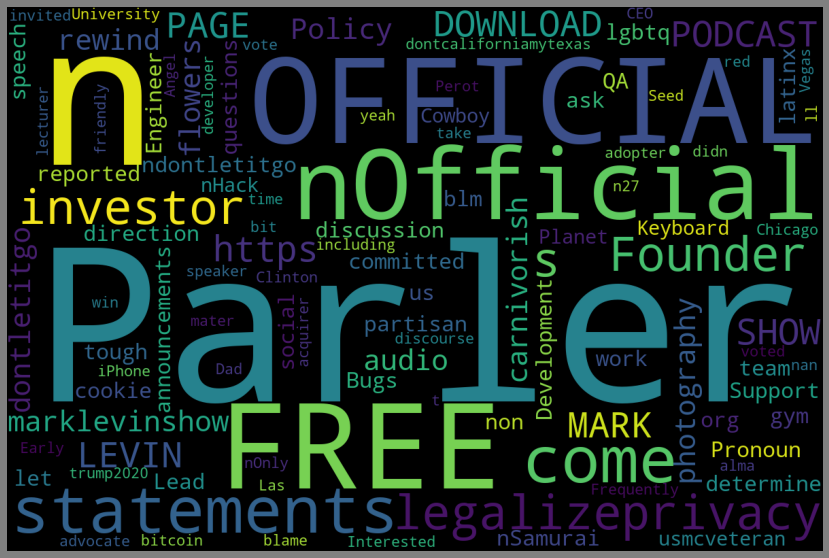

In [50]:
wordcloud = WordCloud(width = 1200, height = 800, 
                background_color ='black', 
                stopwords = stopwords, 
                min_font_size = 9).generate(cloud_words) 
                       
pls.figure(figsize = (30, 10), facecolor = "grey") 
pls.imshow(wordcloud) 
pls.axis("off")  
  
pls.show()

In [51]:
df2_Mentions=df2.sort_values("Score", ascending=False).head(10)
df2_Mentions

,Name,Score,Id,Bio,Joined,Username,Interactions,Human,Verified,Creator,Status
70,Dan Bongino,6000000,823acd76fe299a9a98851c9cdad78df5,RESIST,20181208185010,Dbongino,263,False,True,823acd76fe299a9a98851c9cdad78df5,b
69,Mark Levin,5800000,34968cde93e74071990f927980baa2d9,THIS IS THE OFFICIAL MARK LEVIN SHOW PARLER PA...,20190601031706,Marklevinshow,8478,False,True,34968cde93e74071990f927980baa2d9,b
135,Sean Hannity,5700000,4b8638eca2db4b17b3a7203e40ac8ce7,TV Host Fox News Channel 9 PM EST. Nationally ...,20200624142814,SeanHannity,263,True,True,4b8638eca2db4b17b3a7203e40ac8ce7,a
43,LLinWood,5200000,2ea66900ed69a5005fe51fc8b07a1711,NaN,20181213133214,linwood,258,False,True,2ea66900ed69a5005fe51fc8b07a1711,b
53,Dinesh D’Souza,4500000,27e957738eef23c55a3214d1b1154fbd,"I’m an author, speaker and filmmaker. Find out...",20181212003133,DineshDSouza,259,False,True,27e957738eef23c55a3214d1b1154fbd,b
504,Tommy Robinson,4000000,b1ad1b19a70d43ffa9c21a1b650022a5,I’m back \n\nhttps://www.tr.news/,20190602193935,TommyRobinson,386,False,True,b1ad1b19a70d43ffa9c21a1b650022a5,b
739,The Epoch Times,3500000,4a74305666cb159137a0c105106def7f,"An independent, award-winning voice in print &...",20181219175923,epochtimes,263,True,False,4a74305666cb159137a0c105106def7f,c
146,We Love President Donald J. Trump,2000000,12b91e0106fb4985a6bb347cb83181f7,Defender of MAGA\nTrump 2016-2024\nDailyTruthR...,20190603183448,WeLoveTrump,266,True,False,12b91e0106fb4985a6bb347cb83181f7,c
7726,private,2000000,7826fe7dc30d4d399660ca9b049e3b28,,20200629152238,Redcode71,3,True,False,7826fe7dc30d4d399660ca9b049e3b28,c
55,The Gateway Pundit,2000000,3df53eb29aa5466e9fe84ea689927ae9,Jim Hoft Founder-Editor The Gateway Pundit -- ...,20190611040821,GatewayPundit,259,False,True,3df53eb29aa5466e9fe84ea689927ae9,b


In [52]:
import nltk
#import json
#import glob
from pprint import pprint
from collections import Counter
import string
#nltk.download('stopwords')


In [53]:
content = [i for i in df1["Body"]]
#content
# bodyc=[]
# for i in range(0, len(df1)):
#     bodyc+=df1.iloc[i]["Body"].str()

In [54]:
wordtok = []
wordcountperpost=[]
for i in content:
    #print (len(i))
    words=str(i).split()
    #print(words)
    #break
    wordcount=0;
    for j in words:
        #print(len(j))
        if j[0].isalpha():
            #print(j)
            wordcount+=1
            wordtok += nltk.tokenize.word_tokenize(j)
    wordcountperpost.append(wordcount)
    #print (wordcountperpost)
    #break
    #break
#print(tokens)   

In [55]:
#wordcountperpost

In [56]:
wordtok = [i.lower() for i in wordtok]
#print(tokens)

In [57]:
obj=str.maketrans('', '',string.punctuation)

In [58]:
wordtok = [i.translate(obj) for i in wordtok]

In [59]:
stop_words = set(nltk.corpus.stopwords.words("english"))

In [60]:
wordtok = [i for i in wordtok if i not in stop_words]

In [61]:
wordtok = [i for i in wordtok if len(i)>2]

In [62]:
c1 = Counter(wordtok)

In [63]:
c1.most_common(25)

[('trump', 13901),
 ('election', 7333),
 ('president', 6612),
 ('people', 6408),
 ('get', 4440),
 ('like', 4245),
 ('fraud', 4167),
 ('biden', 3690),
 ('patriots', 3587),
 ('please', 3550),
 ('one', 3462),
 ('time', 3229),
 ('support', 3206),
 ('state', 3080),
 ('know', 3016),
 ('echo', 2907),
 ('america', 2898),
 ('day', 2738),
 ('right', 2717),
 ('stopthesteal', 2699),
 ('votes', 2664),
 ('stand', 2660),
 ('georgia', 2610),
 ('back', 2608),
 ('see', 2602)]

In [64]:
data=[]
for i in range(0,10):
    data.append(list(c1.most_common(10)[i]))

In [65]:
data

[['trump', 13901],
 ['election', 7333],
 ['president', 6612],
 ['people', 6408],
 ['get', 4440],
 ['like', 4245],
 ['fraud', 4167],
 ['biden', 3690],
 ['patriots', 3587],
 ['please', 3550]]

In [66]:
df_bodydata = pd.DataFrame(data, columns = ['Word', 'Occurrence']) 

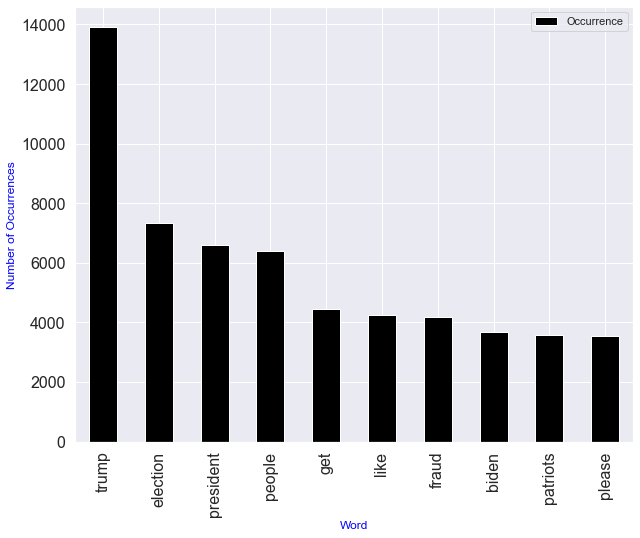

In [67]:
fplot9=df_bodydata.plot(x="Word", y="Occurrence", color='black', kind="bar", xlabel="Word",ylabel="Number of Occurrences",figsize=(10,8),fontsize=16)
fplot9.yaxis.label.set_color('blue')
fplot9.xaxis.label.set_color('blue')


In [68]:
#wordtok

In [69]:
stopwords = set(STOPWORDS) 
cloud_words2 = '' 
for val in wordtok: 
    val = str(val) 
    words = val.split() 
#     for j in range(len(words)): 
#         words[j] = words[j].lower() 
      
    cloud_words2 += " ".join(words)+" "

In [70]:
#cloud_words2

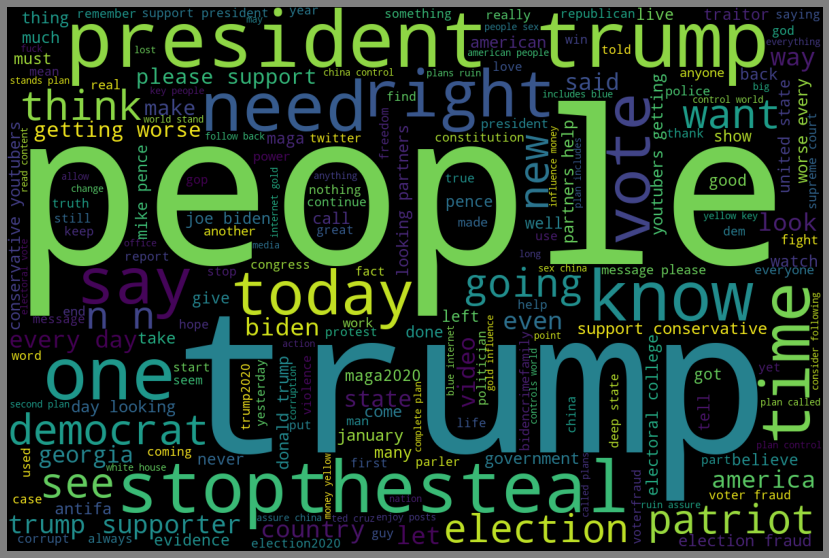

In [71]:
wordcloud = WordCloud(width = 1200, height = 800, 
                background_color ='black', 
                stopwords = stopwords, 
                min_font_size = 9).generate(cloud_words2) 
                       
pls.figure(figsize = (30, 10), facecolor = "grey") 
pls.imshow(wordcloud) 
pls.axis("off")  
  
pls.show()

In [72]:
hashpostcount={}
hashlist=[]
for i in content[:100]:
    
    words=str(i).split()
    
    posthash=[]
    for j in words:
        #print(len(j))
        #print(j)
        k=j
        if j[0]=="#":
            #print(j[0])
            #print(j)
            posthash.append(k.lower())
    hashlist.append(posthash)

In [73]:
#hashlist

In [74]:
hashtok = ""
for i in content:
    
    #print (len(i))
    #print (i)
    words=str(i).split()
    #print(words)
    #break
    #posthash=[]
    for j in words:
        #print(len(j))
        #print(j)
        k=j
        if j[0]=="#":
            #print(j[0])
            #print(j)
            hashtok += k+" "
            #posthash.append(k.lower())
    #hashlist.append(posthash)
#             k=k.lower()
#             if k in hashpostcount: 
#                 hashpostcount[k] += wordcountperpost[content.index(i)]
#             else: 
#                 hashpostcount[k] = wordcountperpost[content.index(i)]
            #print(hashtok)
    #break;
#print(hashpostcount)   

In [75]:
#hashlist

In [76]:
len(hashlist)

100

In [77]:
len(df1["Body"])

101945

In [78]:
hashtok=hashtok.split()

In [79]:
hashtok = [i.lower() for i in hashtok]
#hashtok


In [80]:
len(hashtok)

2825535

In [81]:
c2 = Counter(hashtok)
#c2

In [82]:
c2.most_common(25)

[('#stopthesteal', 61100),
 ('#maga', 49392),
 ('#trump2020', 44889),
 ('#trump', 40826),
 ('#donaldtrump', 37121),
 ('#voterfraud', 34402),
 ('#parler', 26898),
 ('#election2020', 26253),
 ('#electionfraud', 25577),
 ('#usa', 23183),
 ('#patriots', 22321),
 ('#maga2020', 21321),
 ('#fakenews', 21304),
 ('#draintheswamp', 20561),
 ('#dominion', 20496),
 ('#freedom', 20193),
 ('#fightback', 20135),
 ('#trumptrain', 19639),
 ('#wwg1wga', 19578),
 ('#censorship', 18825),
 ('#americafirst', 18124),
 ('#electionintegrity', 17495),
 ('#qanon', 17080),
 ('#covid19', 17010),
 ('#truth', 16676)]

In [83]:
hashtok1=c2.most_common(100)
data2=[]
for i in range(0,10):
    data2.append(list(c2.most_common(10)[i]))

In [84]:
#print(hashpostcount)

In [85]:
for i in hashtok1:
    ii=i[0]
    for j in hashlist:
        #print(j)
        for k in j:
            #print (k)
            if k==ii:
                if ii in hashpostcount: 
                    hashpostcount[ii] += wordcountperpost[hashlist.index(j)]
                else: 
                    hashpostcount[ii] = wordcountperpost[hashlist.index(j)]
                
            
               
            
            #hashpostcount[i]+=wordcountperpost[content.index(j)]
    #print(hashpostcount)

In [86]:
df_hashdata = pd.DataFrame(data2, columns = ['Hashtag', 'Occurrence']) 

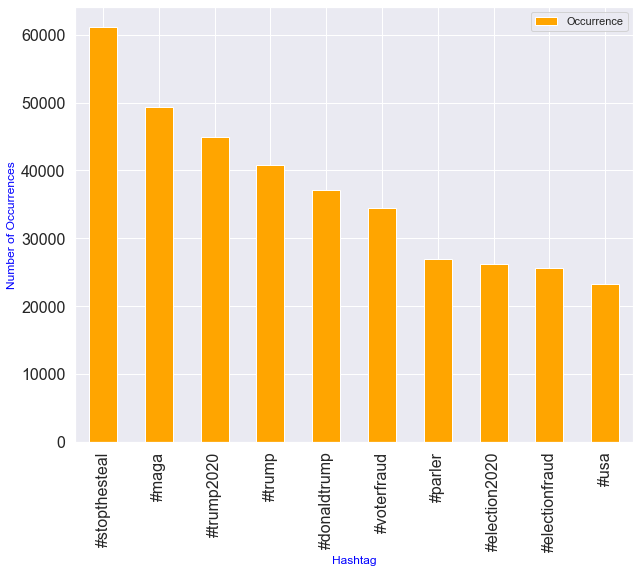

In [87]:
fplot10=df_hashdata.plot(x="Hashtag", y="Occurrence", color='orange', kind="bar", xlabel="Hashtag",ylabel="Number of Occurrences",figsize=(10,8),fontsize=16)
fplot10.yaxis.label.set_color('blue')
fplot10.xaxis.label.set_color('blue')


In [88]:
#hashpostcount

In [89]:
df_postHashtag = pd.DataFrame.from_dict(hashpostcount, orient ='index')
df_postHashtag

,0
#stopthesteal,929
#maga,547
#trump2020,500
#trump,429
#donaldtrump,1000
...,...
#digitalsoldiers,47
#godblessamerica,47
#walkaway,0
#resist,47


In [90]:
df_postHashtag = pd.DataFrame.from_dict(hashpostcount, orient ='index')  

df_postHashtag["Avg_Post_Length"] = df_postHashtag.index
df_postHashtag.columns =["Avg_Post_Length",'Hashtag']
#df2_Interactions=df2.sort_values("Interactions", ascending=False).head(10)

df_postHashtagPlot=df_postHashtag.sort_values("Avg_Post_Length", ascending=False).head(10)
df_postHashtagPlot



,Avg_Post_Length,Hashtag
#donaldtrump,1000,#donaldtrump
#stopthesteal,929,#stopthesteal
#censorship,594,#censorship
#notleaving,552,#notleaving
#kag2020,547,#kag2020
#voterfraud,547,#voterfraud
#maga,547,#maga
#election2020,547,#election2020
#electiontheft,500,#electiontheft
#parler,500,#parler


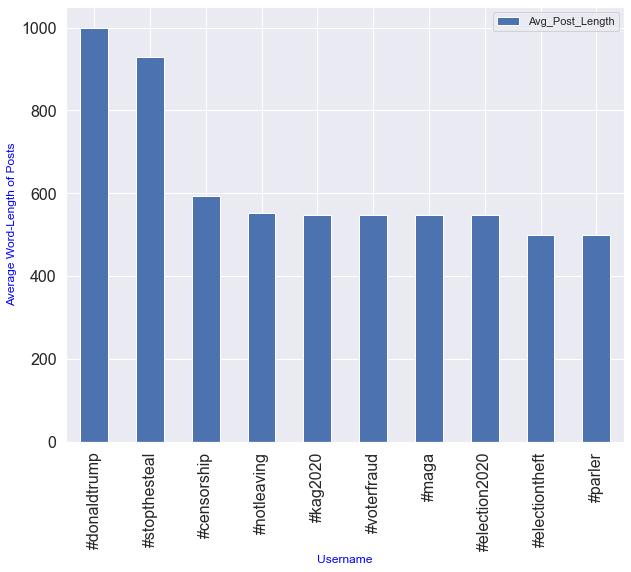

In [91]:
fplot11=df_postHashtagPlot.plot(x="Hashtag", y="Avg_Post_Length", kind="bar", xlabel="Username",ylabel="Average Word-Length of Posts",figsize=(10,8),fontsize=16)
fplot11.yaxis.label.set_color('blue')
fplot11.xaxis.label.set_color('blue')

In [92]:
df2.iloc[0]["Joined"]
#YYYYMMDDHHMMSS

20201127230523

In [93]:
import datetime

In [94]:
def create_datetime(row):
    return datetime.datetime.strptime(str(row["Joined"]),'%Y%m%d%H%M%S')

In [95]:
def create_contdatetime(row):
    return datetime.datetime.strptime(str(row["CreatedAt"]),'%Y%m%d%H%M%S')

In [96]:
df2.apply (lambda row: create_datetime(row), axis=1)

0       2020-11-27 23:05:23
1       2019-05-29 01:16:53
2       2020-11-01 15:43:23
3       2019-05-30 15:12:37
4       2019-05-08 00:47:05
                ...        
22321   2020-05-29 17:22:05
22322   2020-11-20 22:34:02
22323   2020-11-19 15:11:56
22324   2020-11-11 03:24:20
22325   2020-06-16 22:43:51
Length: 22326, dtype: datetime64[ns]

In [97]:
df1.apply (lambda row: create_contdatetime(row), axis=1)

0        2021-01-07 15:20:10
1        2021-01-07 13:53:04
2        2021-01-07 13:32:02
3        2021-01-07 13:29:35
4        2021-01-07 12:27:29
                 ...        
101940   2020-11-27 16:42:37
101941   2020-11-27 16:33:07
101942   2020-11-27 16:28:50
101943   2020-11-27 16:19:10
101944   2020-11-27 16:03:23
Length: 101945, dtype: datetime64[ns]

In [98]:

df2["DateTime"]=df2.apply (lambda row: create_datetime(row), axis=1)

In [99]:
df1["DateTime"]=df1.apply (lambda row: create_contdatetime(row), axis=1)

In [100]:
df2.dtypes
df1.dtypes

Impressions            object
Id                     object
Upvotes                object
At                     object
Comments               object
Reposts                object
CreatedAt               int64
Body                   object
Creator                object
DateTime       datetime64[ns]
dtype: object

In [101]:
df2.iloc[0]["DateTime"]

Timestamp('2020-11-27 23:05:23')

In [102]:
import seaborn as sns
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(18, 8)})

In [103]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

pls.style.use('bmh')

In [104]:
# Plot imports
import chart_studio.plotly.plotly as py
import plotly.express as px
import plotly.graph_objs as go

## Offline mode
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

In [105]:
def create_contdate(row):
    return str(row["CreatedAt"])[0:4]+"-"+str(row["CreatedAt"])[4:6]+"-"+str(row["CreatedAt"])[6:8]

In [106]:
df1['Date'] = df1.apply (lambda row: create_contdate(row), axis=1)

In [107]:
df1_ContentCreated=df1.value_counts("DateTime").reset_index(name='ContentCount')


In [108]:
#df1_ContentCreated=df1.copy()

df1_ContentCreated["DateTime"]=df1["DateTime"]
df1_ContentCreated["Date"]=df1["Date"]

In [109]:
df1_ContentCreated.columns

Index(['DateTime', 'ContentCount', 'Date'], dtype='object')

In [110]:
df1_ContentCreated=df1_ContentCreated.sort_values(by="DateTime")
df1_ContentCreated

,DateTime,ContentCount,Date
89607,2020-07-24 21:15:23,1,2020-07-24
89606,2020-07-24 22:58:34,1,2020-07-24
89605,2020-07-24 23:40:19,1,2020-07-24
89604,2020-07-25 07:49:52,1,2020-07-25
89603,2020-07-25 16:30:55,1,2020-07-25
...,...,...,...
27414,2021-01-08 08:13:35,1,2021-01-08
84480,2021-01-08 08:13:57,1,2021-01-08
39864,2021-01-08 08:14:15,1,2021-01-08
77039,2021-01-08 08:14:49,1,2021-01-08


In [111]:
df1_ContentCreated["TotalContent"]=df1_ContentCreated['ContentCount'].cumsum()

In [112]:
df1_ContentCreatedData = go.Scatter(x=df1_ContentCreated["DateTime"],
                        y=df1_ContentCreated["TotalContent"])
layout = go.Layout(title='Total Content Generated on Parler over Time', xaxis=dict(title='Date'),
                   yaxis=dict(title='(Total Content)'))
fig = go.Figure(data=[df1_ContentCreatedData],layout=layout)

In [113]:
iplot(fig)

In [114]:
df1_ContentCreated2=df1.value_counts("Date").reset_index(name='ContentDayCount')
df1_ContentCreated2=df1_ContentCreated2.sort_values(by="Date")
df1_ContentCreated2

,Date,ContentDayCount
123,2020-07-24,3
143,2020-07-25,2
146,2020-07-27,1
114,2020-07-28,4
96,2020-07-29,5
...,...,...
3,2021-01-04,6621
2,2021-01-05,7580
0,2021-01-06,16593
1,2021-01-07,16251


In [115]:
fig1 = px.bar(df1_ContentCreated2, x="Date", y="ContentDayCount", title="Bar Graph showing Daily Content Creation").update_xaxes(showgrid=True, ticklabelmode="period", dtick="M1", tickformat="%d\n%b\n%Y").update_layout(bargap=0.1).add_trace(go.Scatter(mode="markers", x=df1_ContentCreated2["Date"], y=df1_ContentCreated2["ContentDayCount"], name="Daily Count"))
fig1.show()

In [116]:
df2["DateTime"].count()

22326

In [117]:
def create_date(row):
    return str(row["Joined"])[0:4]+"-"+str(row["Joined"])[4:6]+"-"+str(row["Joined"])[6:8]

def create_time(row):
    return str(row["Joined"])[8:10]+":"+str(row["Joined"])[10:12]+":"+str(row["Joined"])[12:14]

In [118]:
df2.apply (lambda row: create_date(row), axis=1)

0        2020-11-27
1        2019-05-29
2        2020-11-01
3        2019-05-30
4        2019-05-08
            ...    
22321    2020-05-29
22322    2020-11-20
22323    2020-11-19
22324    2020-11-11
22325    2020-06-16
Length: 22326, dtype: object

In [119]:
df2.apply (lambda row: create_time(row), axis=1)

0        23:05:23
1        01:16:53
2        15:43:23
3        15:12:37
4        00:47:05
           ...   
22321    17:22:05
22322    22:34:02
22323    15:11:56
22324    03:24:20
22325    22:43:51
Length: 22326, dtype: object

In [120]:
df2['Date'] = df2.apply (lambda row: create_date(row), axis=1)
df2['Time'] = df2.apply (lambda row: create_date(row), axis=1)

In [121]:
df2_UserJoined=df2.value_counts("DateTime").reset_index(name='UserCount')


In [122]:
df2_UserJoined["DateTime"]=df2["DateTime"]
df2_UserJoined["Date"]=df2["Date"]

In [123]:
df2_UserJoined.columns

Index(['DateTime', 'UserCount', 'Date'], dtype='object')

In [124]:
df2_UserJoined=df2_UserJoined.sort_values(by="DateTime")
df2_UserJoined

,DateTime,UserCount,Date
16619,2018-08-23 19:05:25,1,2018-08-23
104,2018-08-24 13:10:26,1,2018-08-24
6011,2018-08-27 20:30:54,1,2018-08-27
183,2018-08-28 14:54:32,1,2018-08-28
17821,2018-09-28 21:20:37,1,2018-09-28
...,...,...,...
239,2021-01-08 06:06:33,1,2021-01-08
214,2021-01-08 06:10:10,1,2021-01-08
274,2021-01-08 06:10:57,1,2021-01-08
7,2021-01-08 06:50:57,2,2021-01-08


In [125]:
# df2_UserJoined=df2_UserJoined.value_counts("DateTime").reset_index(name='UserCount')
# print(df2_UserJoined).head(10)

In [126]:
df2_UserJoined["TotalUsers"]=df2_UserJoined['UserCount'].cumsum()

In [127]:
df2_UserJoined.head(20)

,DateTime,UserCount,Date,TotalUsers
16619,2018-08-23 19:05:25,1,2018-08-23,1
104,2018-08-24 13:10:26,1,2018-08-24,2
6011,2018-08-27 20:30:54,1,2018-08-27,3
183,2018-08-28 14:54:32,1,2018-08-28,4
17821,2018-09-28 21:20:37,1,2018-09-28,5
13240,2018-09-28 21:34:04,1,2018-09-28,6
9135,2018-09-28 21:48:03,1,2018-09-28,7
1171,2018-09-28 22:28:38,1,2018-09-28,8
7446,2018-09-28 22:36:48,1,2018-09-28,9
9137,2018-09-28 22:52:36,1,2018-09-28,10


In [128]:
df2_UserJoinedData = go.Scatter(x=df2_UserJoined["DateTime"],
                        y=df2_UserJoined["TotalUsers"])
layout = go.Layout(title='Total User Accounts on Parler over Time', xaxis=dict(title='Time'),
                   yaxis=dict(title='(Total Users)'))
fig = go.Figure(data=[df2_UserJoinedData],layout=layout)

In [129]:
iplot(fig)

In [130]:
df2_UserJoined2=df2_UserJoined.copy()

In [131]:
df2_UserJoined2=df2.value_counts("Date").reset_index(name='UserDayCount')
df2_UserJoined2

,Date,UserDayCount
0,2020-11-08,1006
1,2020-11-09,895
2,2020-06-26,773
3,2020-06-25,705
4,2020-06-24,657
...,...,...
616,2020-01-13,1
617,2020-01-14,1
618,2020-01-16,1
619,2020-01-18,1


In [132]:
df2_UserJoined2=df2_UserJoined2.sort_values(by="Date")
df2_UserJoined2

,Date,UserDayCount
620,2018-08-23,1
505,2018-08-24,1
506,2018-08-27,1
499,2018-08-28,1
313,2018-09-28,7
...,...,...
65,2021-01-04,62
84,2021-01-05,48
92,2021-01-06,45
25,2021-01-07,194


In [133]:
df2_UserJoined2.columns

Index(['Date', 'UserDayCount'], dtype='object')

In [134]:
fig2 = px.bar(df2_UserJoined2, x="Date", y="UserDayCount", title="Bar Graph showing Daily User Account Creation").update_xaxes(showgrid=True, ticklabelmode="period", dtick="M2", tickformat="%d\n%b\n%Y", ).update_layout(bargap=0.01).add_trace(go.Scatter(mode="markers", x=df2_UserJoined2["Date"], y=df2_UserJoined2["UserDayCount"], name="Daily Count"))
fig2.show()


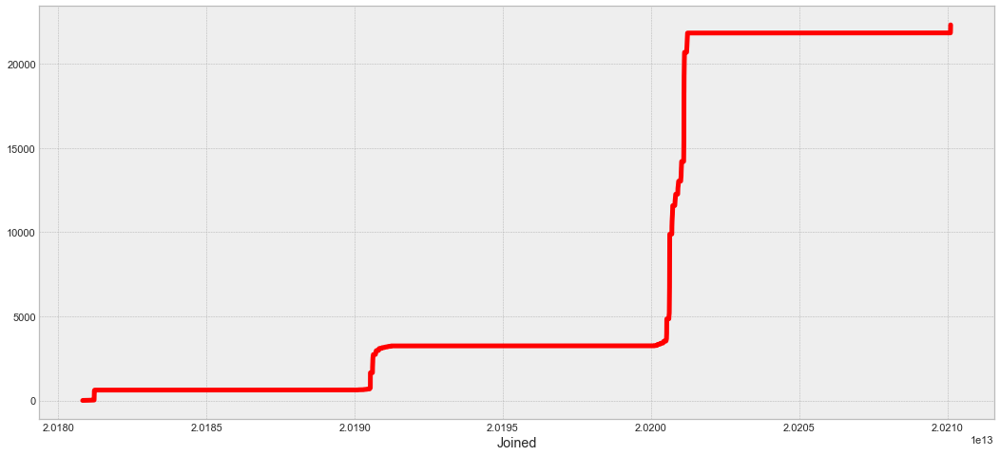

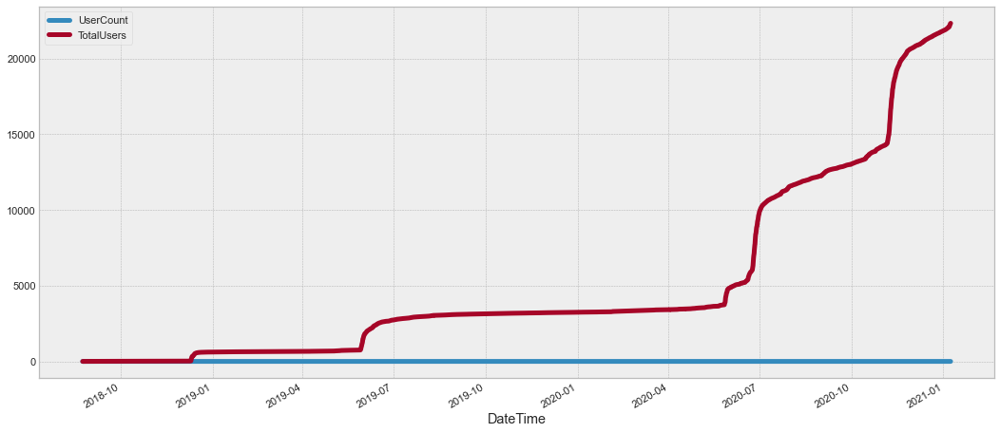

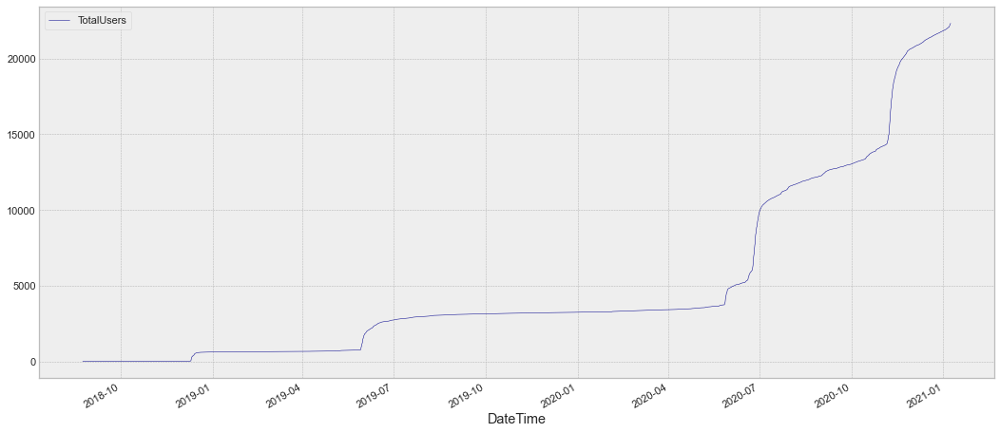

In [135]:
#Other Ways to Plot 
df2.groupby("Joined").DateTime.count().cumsum().plot(kind="line",linewidth=5, color="red")
df2_UserJoined.plot(x="DateTime", linewidth=5)
df2_UserJoined.plot(x="DateTime",y="TotalUsers",linewidth=0.5, color="darkblue");